# Dataset Description

**Columns: artists, track_name, popularity, duration_ms, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo, explicit, id, release_date, year (no genre or count).**

## Import Libraries

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px  # For interactive 3D plots
import warnings
warnings.filterwarnings('ignore')

plt.style.use('default')
%matplotlib inline

## EDA for data.csv (Individual Tracks)

**Load and Enhanced Inspection**

In [4]:
df_tracks = pd.read_csv("./data.csv")
print("Shape:", df_tracks.shape)
print("\nFirst 5 Rows:\n", df_tracks.head())

Shape: (170653, 19)

First 5 Rows:
    valence  year  acousticness  \
0   0.0594  1921         0.982   
1   0.9630  1921         0.732   
2   0.0394  1921         0.961   
3   0.1650  1921         0.967   
4   0.2530  1921         0.957   

                                             artists  danceability  \
0  ['Sergei Rachmaninoff', 'James Levine', 'Berli...         0.279   
1                                     ['Dennis Day']         0.819   
2  ['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...         0.328   
3                                   ['Frank Parker']         0.275   
4                                     ['Phil Regan']         0.418   

   duration_ms  energy  explicit                      id  instrumentalness  \
0       831667   0.211         0  4BJqT0PrAfrxzMOxytFOIz          0.878000   
1       180533   0.341         0  7xPhfUan2yNtyFG0cUWkt8          0.000000   
2       500062   0.166         0  1o6I8BglA6ylDMrIELygv1          0.913000   
3       210000   0.309    

In [5]:
print("\nInfo:\n", df_tracks.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [6]:
print("\nColumns:", df_tracks.columns.tolist())


Columns: ['valence', 'year', 'acousticness', 'artists', 'danceability', 'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date', 'speechiness', 'tempo']


In [7]:
print("\nDuplicates:", df_tracks[['name', 'artists']].duplicated().sum())


Duplicates: 12968


In [8]:
print("\nYear Range:", df_tracks['year'].min(), "-", df_tracks['year'].max())


Year Range: 1921 - 2020


In [9]:
# Basic statistics of numerical columns
print("\nBasic Statistics:")
print(df_tracks.describe())


Basic Statistics:
             valence           year   acousticness   danceability  \
count  170653.000000  170653.000000  170653.000000  170653.000000   
mean        0.528587    1976.787241       0.502115       0.537396   
std         0.263171      25.917853       0.376032       0.176138   
min         0.000000    1921.000000       0.000000       0.000000   
25%         0.317000    1956.000000       0.102000       0.415000   
50%         0.540000    1977.000000       0.516000       0.548000   
75%         0.747000    1999.000000       0.893000       0.668000   
max         1.000000    2020.000000       0.996000       0.988000   

        duration_ms         energy       explicit  instrumentalness  \
count  1.706530e+05  170653.000000  170653.000000     170653.000000   
mean   2.309483e+05       0.482389       0.084575          0.167010   
std    1.261184e+05       0.267646       0.278249          0.313475   
min    5.108000e+03       0.000000       0.000000          0.000000   
25% 

**Handle Missing Data**

*Identify and address missing values to ensure data quality.*

In [10]:
# Check for missing values
print("Missing Values:\n", df_tracks.isnull().sum())

# Handle missing values (example: drop rows with missing critical data)
df_tracks_cleaned = df_tracks.dropna(subset=['name', 'artists'])  # Drop if track or artist is missing
print("Shape after dropping missing values:", df_tracks_cleaned.shape)

Missing Values:
 valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64
Shape after dropping missing values: (170653, 19)


**Explore Categorical Variables**

*Analyze non-numerical columns like artists and name.*

In [11]:
# Top 10 most frequent artists
print("Top 10 Artists:\n", df_tracks['artists'].value_counts().head(10))

# Number of unique name
print("Number of Unique name:", df_tracks['name'].nunique())

# Top 10 name by frequency
print("Top 10 name:\n", df_tracks['name'].value_counts().head(10))

Top 10 Artists:
 artists
['Эрнест Хемингуэй']      1211
['Эрих Мария Ремарк']     1068
['Francisco Canaro']       942
['Frank Sinatra']          630
['Ignacio Corsini']        628
['Elvis Presley']          504
['Johnny Cash']            484
['Bob Dylan']              474
['The Rolling Stones']     471
['The Beach Boys']         455
Name: count, dtype: int64
Number of Unique name: 133638
Top 10 name:
 name
White Christmas       73
Winter Wonderland     63
Summertime            56
Jingle Bells          53
Overture              46
Silent Night          45
Home                  40
The Christmas Song    36
Silver Bells          36
Sleigh Ride           35
Name: count, dtype: int64


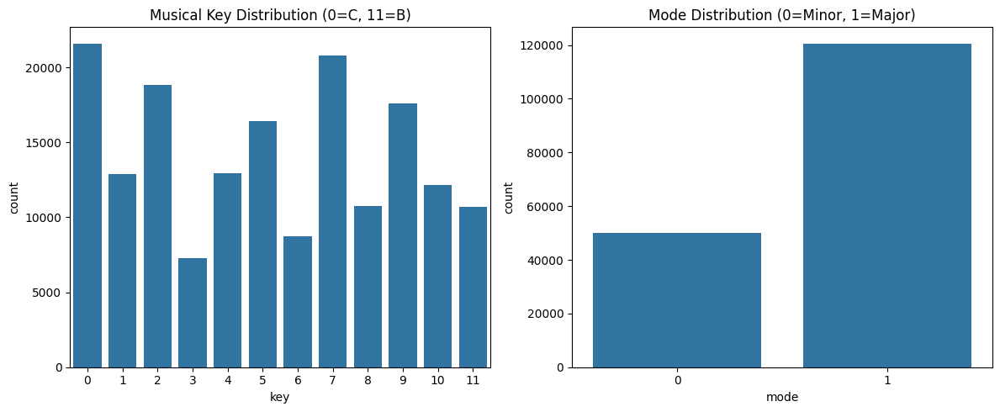

Chi-Square (Key vs. Mode): chi2=8713.91, p-value=0.0000


In [12]:
# Key and mode distribution
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.countplot(x='key', data=df_tracks, order=range(12))
plt.title("Musical Key Distribution (0=C, 11=B)")
plt.subplot(1, 2, 2)
sns.countplot(x='mode', data=df_tracks)
plt.title("Mode Distribution (0=Minor, 1=Major)")
plt.tight_layout()
plt.show()

# Chi-square test
contingency = pd.crosstab(df_tracks['key'], df_tracks['mode'])
chi2, p, _, _ = stats.chi2_contingency(contingency)
print(f"Chi-Square (Key vs. Mode): chi2={chi2:.2f}, p-value={p:.4f}")

**Analyze Numerical Features**

*Examine distributions and relationships of audio features.*


Summary Stats:
           popularity   duration_ms   danceability         energy  \
count  170653.000000  1.706530e+05  170653.000000  170653.000000   
mean       31.431794  2.309483e+05       0.537396       0.482389   
std        21.826615  1.261184e+05       0.176138       0.267646   
min         0.000000  5.108000e+03       0.000000       0.000000   
25%        11.000000  1.698270e+05       0.415000       0.255000   
50%        33.000000  2.074670e+05       0.548000       0.471000   
75%        48.000000  2.624000e+05       0.668000       0.703000   
max       100.000000  5.403500e+06       0.988000       1.000000   

            loudness          tempo  
count  170653.000000  170653.000000  
mean      -11.467990     116.861590  
std         5.697943      30.708533  
min       -60.000000       0.000000  
25%       -14.615000      93.421000  
50%       -10.580000     114.729000  
75%        -7.183000     135.537000  
max         3.855000     243.507000  
Outliers:
 {'popularity': np

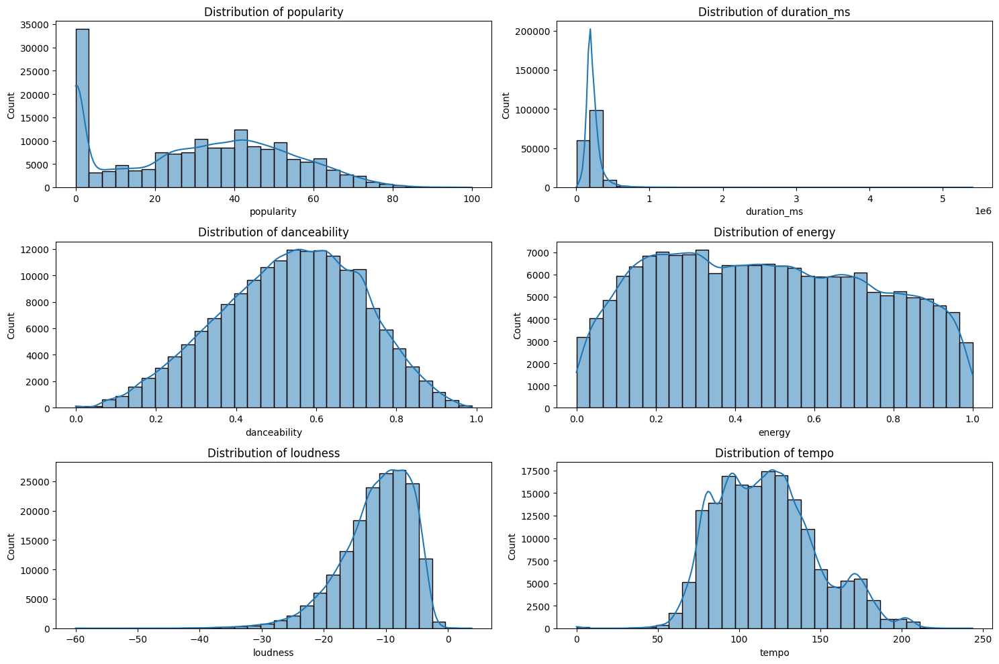

In [13]:
# Summary stats
numeric_cols = ['popularity', 'duration_ms', 'danceability', 'energy', 'loudness', 'tempo']
print("\nSummary Stats:\n", df_tracks[numeric_cols].describe())

# Outlier detection
def detect_outliers(df_tracks, col):
    Q1, Q3 = df_tracks[col].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
    return df_tracks[(df_tracks[col] < lower) | (df_tracks[col] > upper)][col].count()

print("Outliers:\n", {col: detect_outliers(df_tracks, col) for col in numeric_cols})

# Distributions
plt.figure(figsize=(15, 10))
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(3, 2, i)
    sns.histplot(df_tracks[col], bins=30, kde=True)
    plt.title(f"Distribution of {col}")
plt.tight_layout()
plt.show()

*popularity likely skewed; duration_ms outliers may be live tracks.*

**Correlation Analysis**

*Investigate relationships between numerical features.*

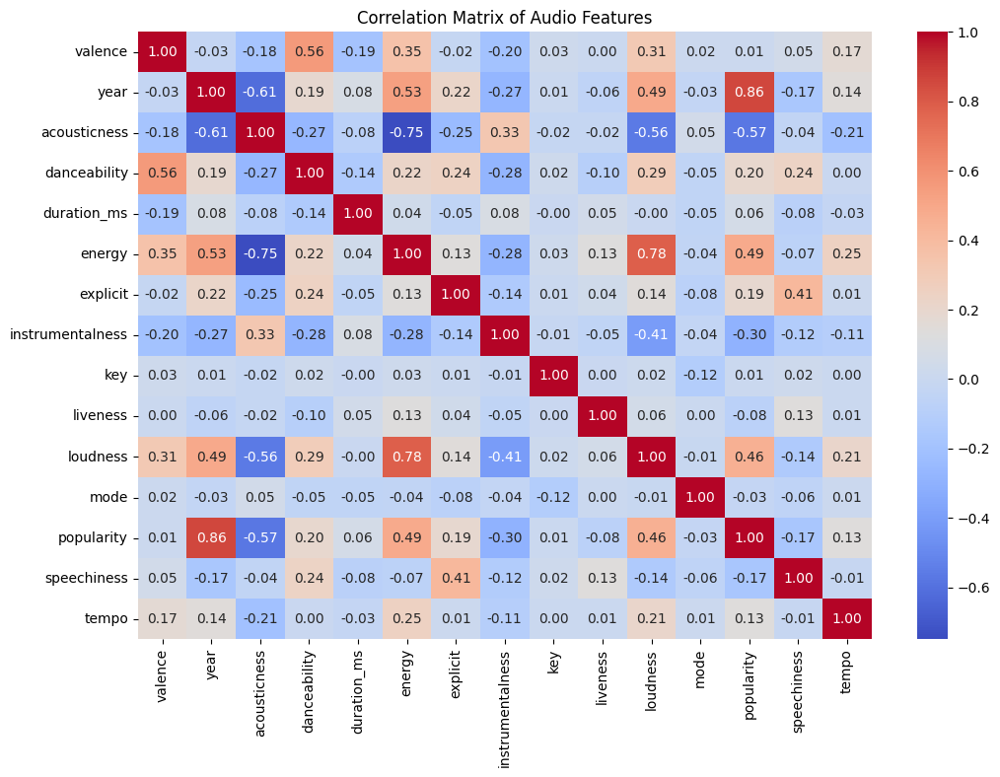

In [14]:
# Select numerical columns
numeric_cols = df_tracks.select_dtypes(include=['float64', 'int64']).columns

# Correlation matrix
corr_matrix = df_tracks[numeric_cols].corr()

# Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix of Audio Features")
plt.show()

*High correlation between energy and loudness (both relate to intensity).*

*Low correlation between danceability and acousticness (dance tracks are less acoustic).*

**Most tracks might be 3-5 minutes (180,000-300,000 ms), but outliers could be intros or full albums misclassified as tracks.**

**Pair Plot: Numerical Features**

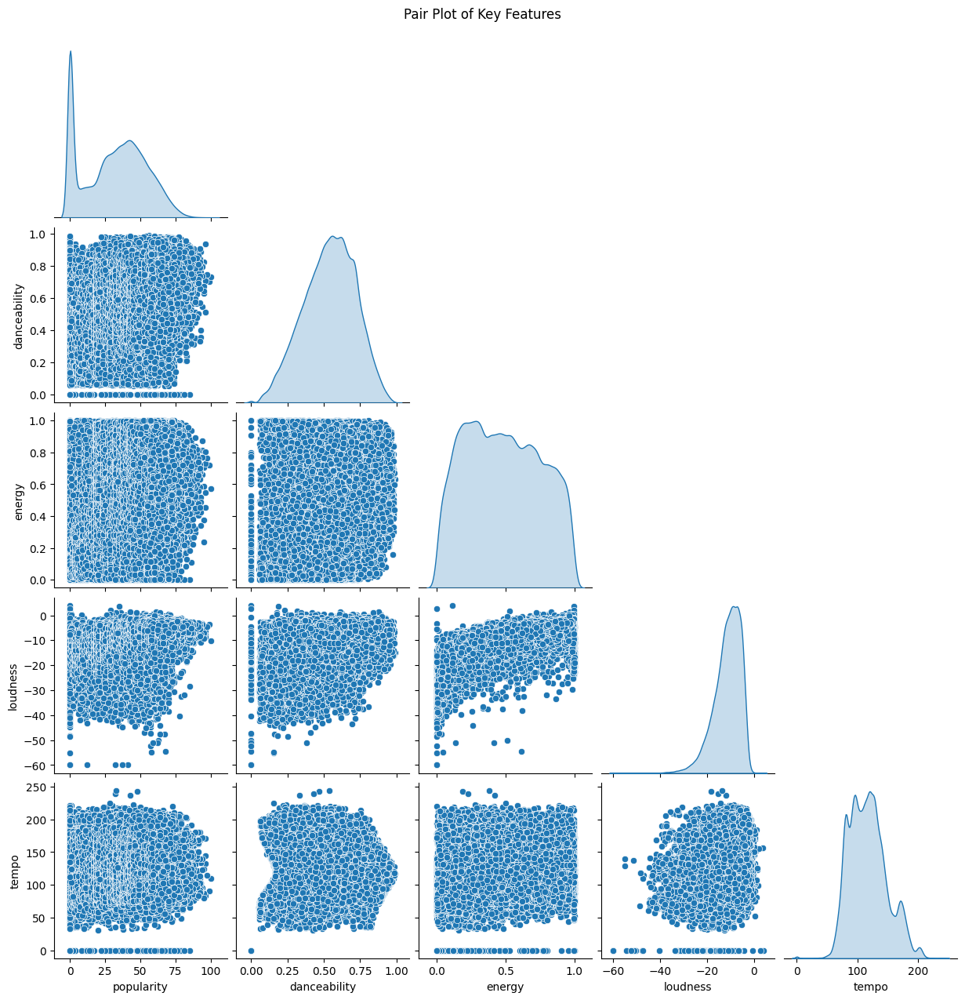

In [15]:
numeric_cols = ['popularity', 'danceability', 'energy', 'loudness', 'tempo']
sns.pairplot(df_tracks[numeric_cols], diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Key Features", y=1.02)
plt.show()

**Result: energy vs. loudness shows a tight positive trend; popularity is skewed.**

**Analysis: Strong correlation (e.g., r~0.7) between energy and loudness indicates louder tracks are more energetic.**

**Box Plot: Popularity by Decade**

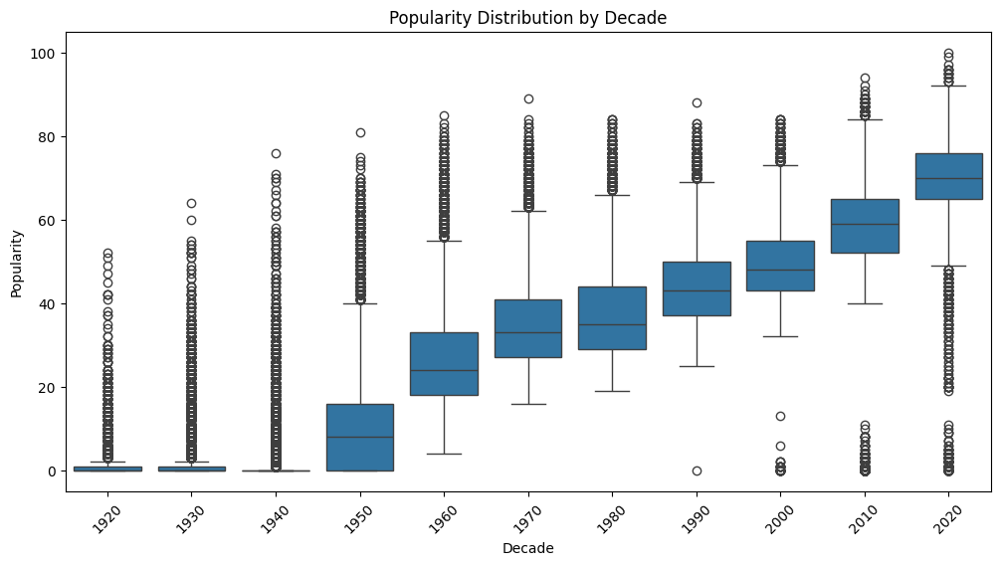

In [16]:
df_tracks['decade'] = (df_tracks['year'] // 10) * 10
plt.figure(figsize=(12, 6))
sns.boxplot(x='decade', y='popularity', data=df_tracks)
plt.title("Popularity Distribution by Decade")
plt.xlabel("Decade")
plt.ylabel("Popularity")
plt.xticks(rotation=45)
plt.show()

**Result: Median popularity rises post-2000; older decades have more outliers.**

**Analysis: Streaming era boosts modern track popularity; outliers in 1920s-1960s may be classics.**

## EDA for data_by_artists.csv

# Dataset Description

**Columns: artist, count, popularity, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo (averages per artist).**

**Load and Inspection**

In [17]:
df_artists = pd.read_csv("./data_by_artist.csv").rename(columns={'artists': 'artist'})
print("Shape:", df_artists.shape)
print("\nFirst 5 Rows:\n", df_artists.head())
print("\nInfo:\n", df_artists.info())

Shape: (28680, 15)

First 5 Rows:
    mode  count  acousticness  \
0     1      9      0.590111   
1     1     26      0.862538   
2     1      7      0.856571   
3     1     27      0.884926   
4     1      7      0.510714   

                                              artist  danceability  \
0                   "Cats" 1981 Original London Cast      0.467222   
1                          "Cats" 1983 Broadway Cast      0.441731   
2        "Fiddler On The Roof” Motion Picture Chorus      0.348286   
3     "Fiddler On The Roof” Motion Picture Orchestra      0.425074   
4  "Joseph And The Amazing Technicolor Dreamcoat"...      0.467143   

     duration_ms    energy  instrumentalness  liveness   loudness  \
0  250318.555556  0.394003          0.011400  0.290833 -14.448000   
1  287280.000000  0.406808          0.081158  0.315215 -10.690000   
2  328920.000000  0.286571          0.024593  0.325786 -15.230714   
3  262890.962963  0.245770          0.073587  0.275481 -15.639370   
4  270

**Missing Data**

In [18]:
print("Missing Values:\n", df_artists.isnull().sum())

Missing Values:
 mode                0
count               0
acousticness        0
artist              0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
key                 0
dtype: int64


**Analysis**

Top 10 by Count:
                   artist  count
8367    Francisco Canaro   3169
28561   Эрнест Хемингуэй   2422
28560  Эрих Мария Ремарк   2136
8434       Frank Sinatra   1459
10714    Ignacio Corsini   1256
27109  Vladimir Horowitz   1200
1682    Arturo Toscanini   1146
2707      Billie Holiday   1103
12378        Johnny Cash   1061
7426       Elvis Presley   1023
Top 10 by Popularity:
                 artist  popularity
20966      Ritt Momney        93.0
14354        Lele Pons        92.0
15070  Los Legendarios        90.0
11764         Jerry Di        89.0
7463            Emilee        88.0
28263      salem ilese        88.0
23687        Surf Mesa        88.0
213                A7S        87.0
14378     Lenny Santos        86.0
16453        Master KG        86.0


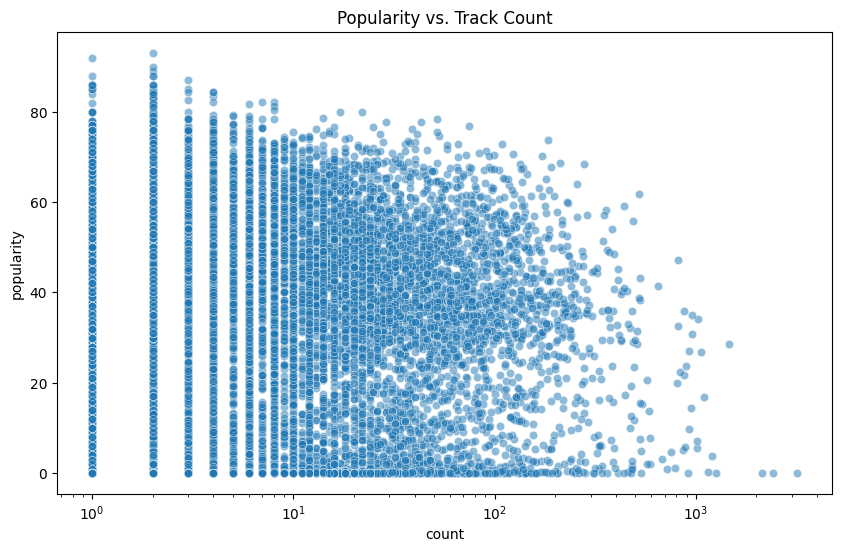

In [19]:
# Top artists by count and popularity
print("Top 10 by Count:\n", df_artists[['artist', 'count']].sort_values('count', ascending=False).head(10))
print("Top 10 by Popularity:\n", df_artists[['artist', 'popularity']].sort_values('popularity', ascending=False).head(10))

# Scatter with log scale
plt.figure(figsize=(10, 6))
sns.scatterplot(x='count', y='popularity', data=df_artists, alpha=0.5)
plt.xscale('log')
plt.title("Popularity vs. Track Count")
plt.show()

# Feature engineering
df_artists['pop_per_track'] = df_artists['popularity'] / df_artists['count']

*High count artists may not always be popular (e.g., classical vs. modern pop).*

**Scatter Plot: Popularity vs. Count (Log Scale)**

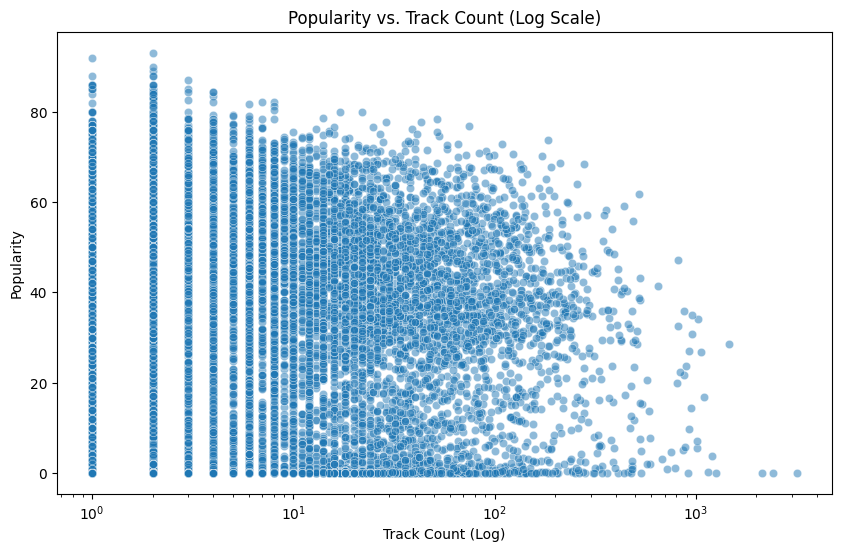

In [20]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='count', y='popularity', data=df_artists, alpha=0.5)
plt.xscale('log')
plt.title("Popularity vs. Track Count (Log Scale)")
plt.xlabel("Track Count (Log)")
plt.ylabel("Popularity")
plt.show()

**Result: Weak positive trend; some high-count artists have low popularity.**

**Analysis: Popularity doesn’t scale linearly with output—modern artists may outshine prolific older ones.**

**Violin Plot: Feature Distributions**

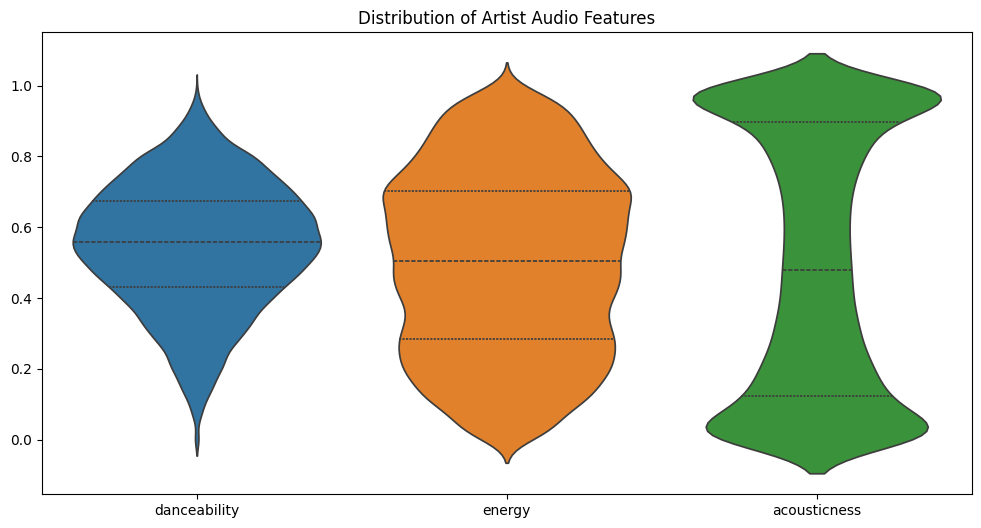

In [21]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=df_artists[['danceability', 'energy', 'acousticness']], inner='quartile')
plt.title("Distribution of Artist Audio Features")
plt.show()

**Result: danceability peaks ~0.5-0.6; acousticness has a long tail.**

**Analysis: Artists vary widely in style; acoustic outliers may be folk/classical.**

# EDA for data_by_genres.csv

## Dataset Description

**Columns: genres, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo (averages per genre).**

**Load and Inspection**

In [22]:
df_genres = pd.read_csv("./data_by_genres.csv")
print("Shape:", df_genres.shape)
print("\nFirst 5 Rows:\n", df_genres.head())
print("\nUnique Genres:", df_genres['genres'].nunique())

Shape: (2973, 14)

First 5 Rows:
    mode                  genres  acousticness  danceability   duration_ms  \
0     1  21st century classical      0.979333      0.162883  1.602977e+05   
1     1                   432hz      0.494780      0.299333  1.048887e+06   
2     1                   8-bit      0.762000      0.712000  1.151770e+05   
3     1                      []      0.651417      0.529093  2.328809e+05   
4     1              a cappella      0.676557      0.538961  1.906285e+05   

     energy  instrumentalness  liveness   loudness  speechiness       tempo  \
0  0.071317          0.606834  0.361600 -31.514333     0.040567   75.336500   
1  0.450678          0.477762  0.131000 -16.854000     0.076817  120.285667   
2  0.818000          0.876000  0.126000  -9.180000     0.047000  133.444000   
3  0.419146          0.205309  0.218696 -12.288965     0.107872  112.857352   
4  0.316434          0.003003  0.172254 -12.479387     0.082851  112.110362   

    valence  popularity  key

**Analysis**

Top 10 by Danceability:
                         genres  danceability
1012        experimental house        0.9290
1238                guam indie        0.9200
917              dutch hip hop        0.9110
924              dutch rap pop        0.9074
364   british children's music        0.9060
1358          indie deutschrap        0.9030
2743           trance mexicano        0.9020
1072                  footwork        0.8970
1119             funk paulista        0.8960
2244                 proto-rap        0.8930


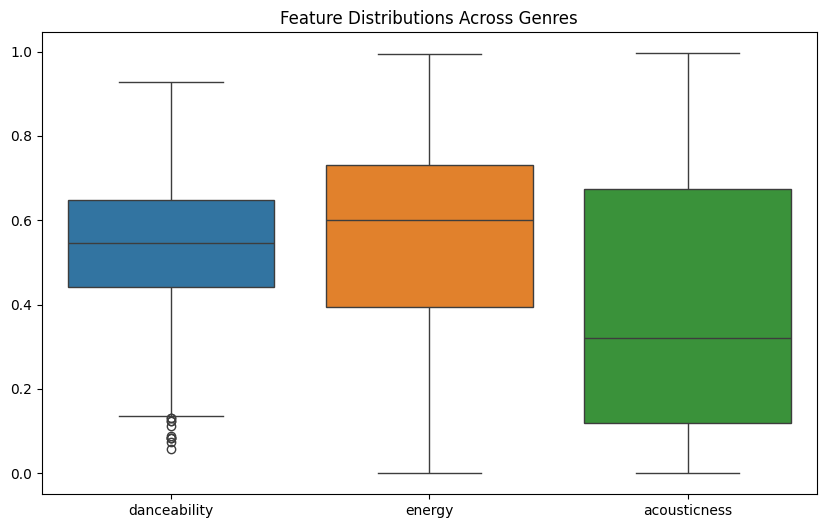

In [23]:
# Top genres by danceability
print("Top 10 by Danceability:\n", df_genres[['genres', 'danceability']].sort_values('danceability', ascending=False).head(10))

# Boxplot for key features
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_genres[['danceability', 'energy', 'acousticness']])
plt.title("Feature Distributions Across Genres")
plt.show()

**3D Scatter: Feature Space**

In [24]:
fig = px.scatter_3d(df_genres, x='danceability', y='energy', z='valence', color='genres', 
                    title="Genre Feature Space", opacity=0.7)
fig.show()

**Result: Clusters emerge (e.g., high dance/energy for EDM, low for Classical).**

**Analysis: Genres form distinct stylistic groups in 3D space.**

**Heatmap: Feature Correlations**

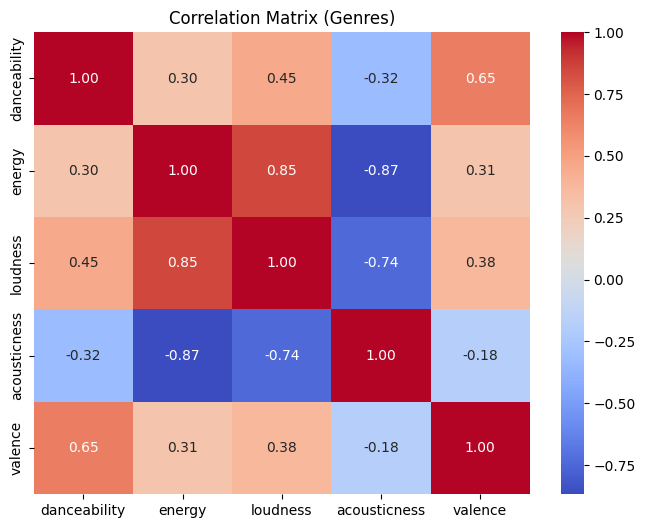

In [25]:
corr_matrix = df_genres[['danceability', 'energy', 'loudness', 'acousticness', 'valence']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix (Genres)")
plt.show()

**Result: energy vs. loudness (0.8); acousticness negatively correlates with both (-0.6).**

**Analysis: Energetic genres are loud and less acoustic.**

# EDA for data_by_year.csv

## Dataset Description

**Columns: year, popularity, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo (averages per year).**

In [26]:
df_years = pd.read_csv("./data_by_year.csv")
print("Shape:", df_years.shape)
print("\nFirst 5 Rows:\n", df_years.head())

Shape: (100, 14)

First 5 Rows:
    mode  year  acousticness  danceability    duration_ms    energy  \
0     1  1921      0.886896      0.418597  260537.166667  0.231815   
1     1  1922      0.938592      0.482042  165469.746479  0.237815   
2     1  1923      0.957247      0.577341  177942.362162  0.262406   
3     1  1924      0.940200      0.549894  191046.707627  0.344347   
4     1  1925      0.962607      0.573863  184986.924460  0.278594   

   instrumentalness  liveness   loudness  speechiness       tempo   valence  \
0          0.344878  0.205710 -17.048667     0.073662  101.531493  0.379327   
1          0.434195  0.240720 -19.275282     0.116655  100.884521  0.535549   
2          0.371733  0.227462 -14.129211     0.093949  114.010730  0.625492   
3          0.581701  0.235219 -14.231343     0.092089  120.689572  0.663725   
4          0.418297  0.237668 -14.146414     0.111918  115.521921  0.621929   

   popularity  key  
0    0.653333    2  
1    0.140845   10  
2    5.3

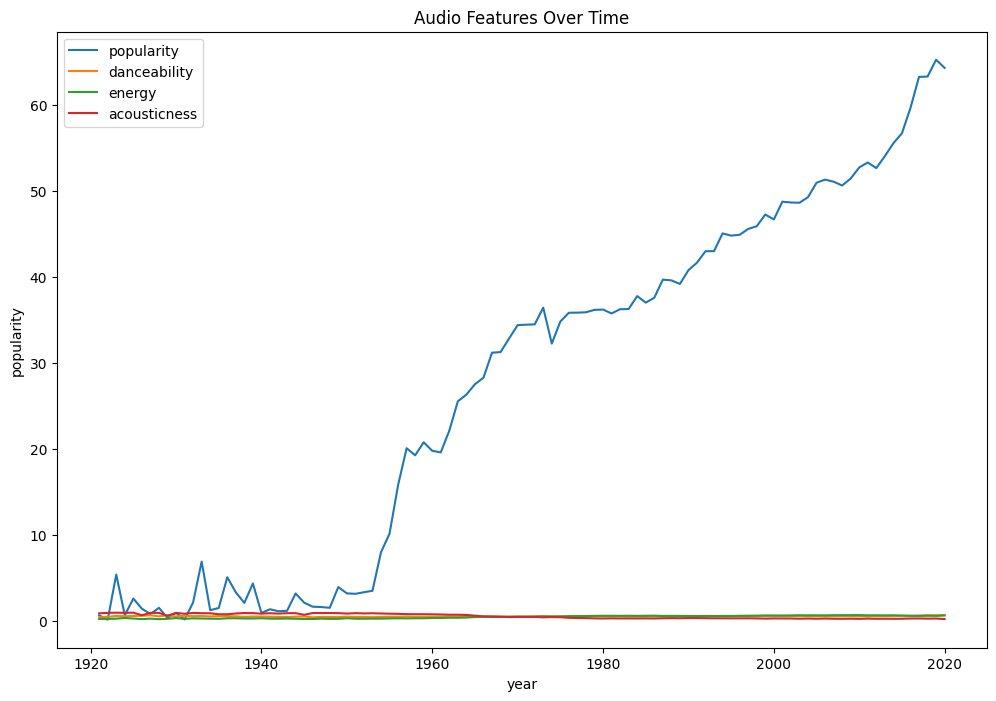

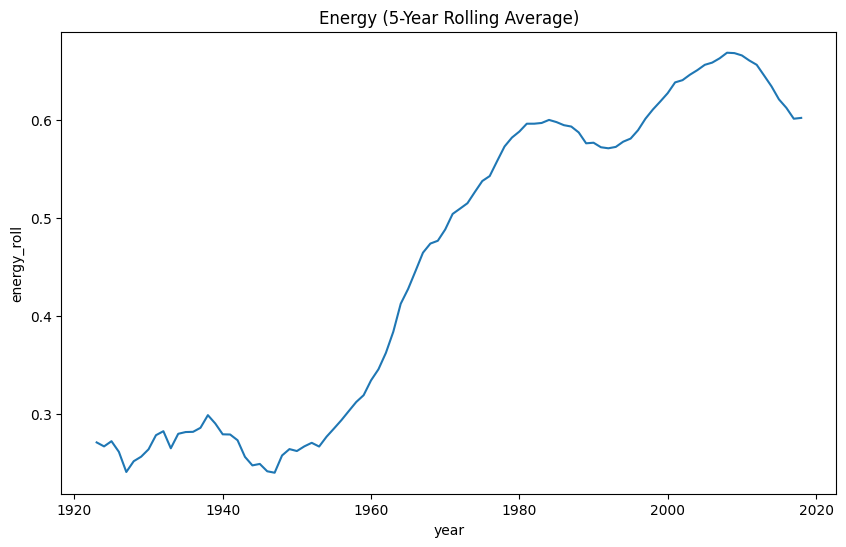

In [27]:
# Trends
plt.figure(figsize=(12, 8))
for col in ['popularity', 'danceability', 'energy', 'acousticness']:
    sns.lineplot(x='year', y=col, data=df_years, label=col)
plt.title("Audio Features Over Time")
plt.legend()
plt.show()

# Rolling average
df_years['energy_roll'] = df_years['energy'].rolling(window=5, center=True).mean()
plt.figure(figsize=(10, 6))
sns.lineplot(x='year', y='energy_roll', data=df_years)
plt.title("Energy (5-Year Rolling Average)")
plt.show()

**Modern years likely show higher danceability**

**Line Plot: Feature Trends**

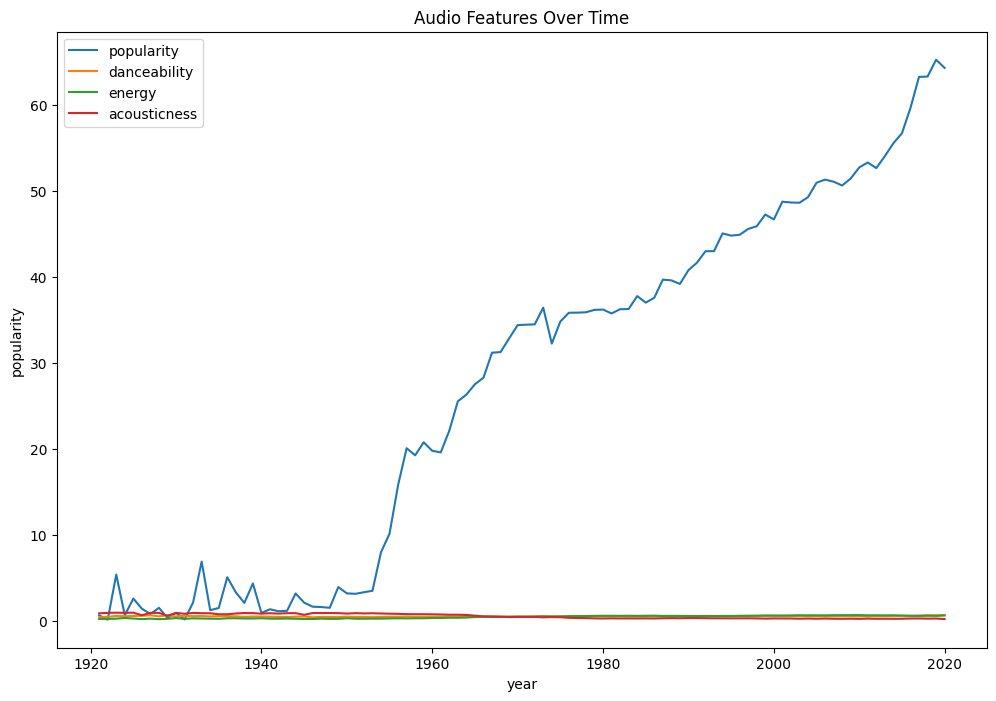

In [28]:
plt.figure(figsize=(12, 8))
for col in ['popularity', 'danceability', 'energy', 'acousticness']:
    sns.lineplot(x='year', y=col, data=df_years, label=col)
plt.title("Audio Features Over Time")
plt.legend()
plt.show()

**Result: danceability and energy rise post-1980; acousticness drops.**

**Analysis: Modern music favors danceable, energetic tracks over acoustic ones.**

**Area Plot: Feature Proportions**

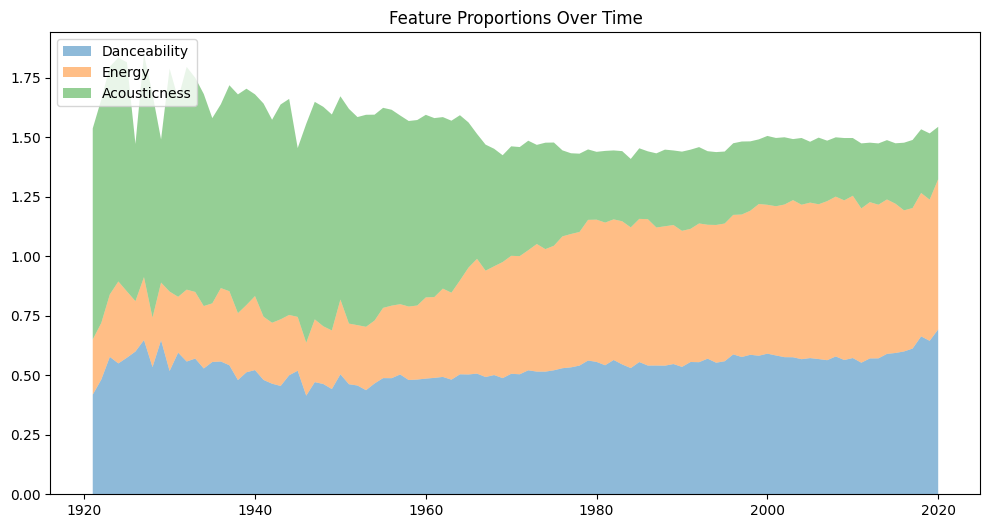

In [29]:
plt.figure(figsize=(12, 6))
plt.stackplot(df_years['year'], df_years['danceability'], df_years['energy'], df_years['acousticness'],
              labels=['Danceability', 'Energy', 'Acousticness'], alpha=0.5)
plt.title("Feature Proportions Over Time")
plt.legend(loc='upper left')
plt.show()

**Result: acousticness dominates pre-1960; danceability grows post-2000.**

**Analysis: Shift reflects technological and cultural changes (e.g., electronic music).**

**Box Plot: Popularity by Decade**

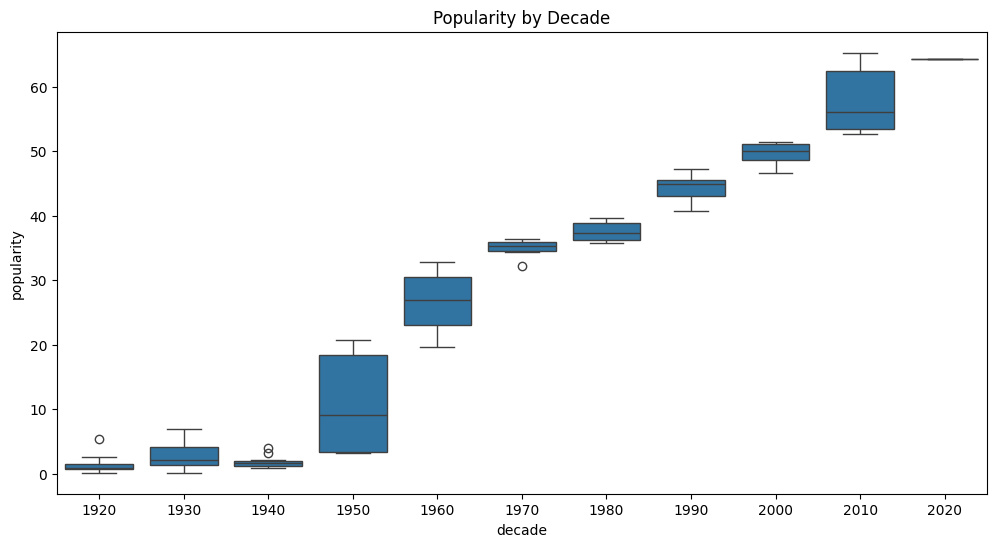

In [30]:
df_years['decade'] = (df_years['year'] // 10) * 10
plt.figure(figsize=(12, 6))
sns.boxplot(x='decade', y='popularity', data=df_years)
plt.title("Popularity by Decade")
plt.show()

**Result: Higher medians in recent decades.**

**Analysis: Streaming boosts average popularity over time.**

# EDA for data_w_genres.csv

**Columns: artist, genres (list), popularity, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo.**

**Load and inspection**

In [31]:
df_w_genres = pd.read_csv("./data_w_genres.csv").rename(columns={'artists': 'artist'})
df_w_genres['genres'] = df_w_genres['genres'].apply(lambda x: eval(x) if isinstance(x, str) else x)
print("Shape:", df_w_genres.shape)
print("\nFirst 5 Rows:\n", df_w_genres.head())

Shape: (28680, 16)

First 5 Rows:
          genres                                             artist  \
0  [show tunes]                   "Cats" 1981 Original London Cast   
1            []                          "Cats" 1983 Broadway Cast   
2            []        "Fiddler On The Roof” Motion Picture Chorus   
3            []     "Fiddler On The Roof” Motion Picture Orchestra   
4            []  "Joseph And The Amazing Technicolor Dreamcoat"...   

   acousticness  danceability    duration_ms    energy  instrumentalness  \
0      0.590111      0.467222  250318.555556  0.394003          0.011400   
1      0.862538      0.441731  287280.000000  0.406808          0.081158   
2      0.856571      0.348286  328920.000000  0.286571          0.024593   
3      0.884926      0.425074  262890.962963  0.245770          0.073587   
4      0.510714      0.467143  270436.142857  0.488286          0.009400   

   liveness   loudness  speechiness       tempo   valence  popularity  key  \
0  0.2908

**Genre Analysis**

Top 10 Genres:
 genres
rock                  611
pop                   593
dance pop             572
rap                   516
hip hop               507
pop rap               482
modern rock           400
pop rock              400
country rock          394
urban contemporary    383
Name: count, dtype: int64


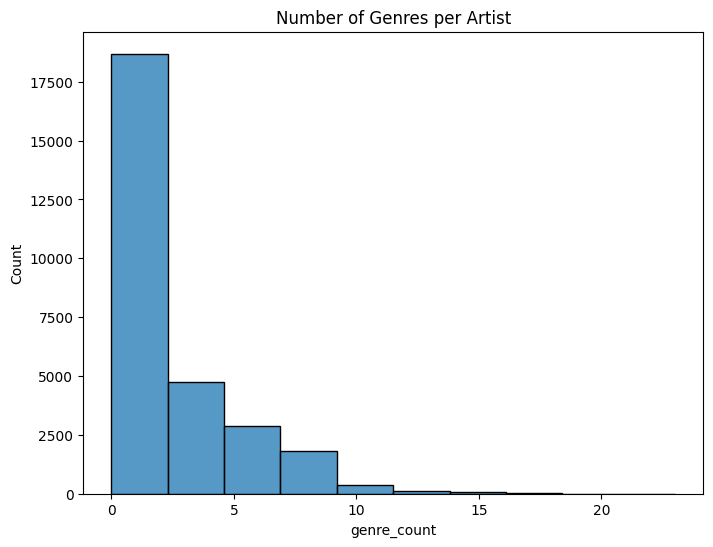

In [32]:
df_genres_exploded = df_w_genres.explode('genres')
print("Top 10 Genres:\n", df_genres_exploded['genres'].value_counts().head(10))

# Genre count per artist
df_w_genres['genre_count'] = df_w_genres['genres'].apply(len)
plt.figure(figsize=(8, 6))
sns.histplot(df_w_genres['genre_count'], bins=10)
plt.title("Number of Genres per Artist")
plt.show()

**Multi-genre artists are common.**

**Visualization**

**Bar Plot: Top 10 Genres**

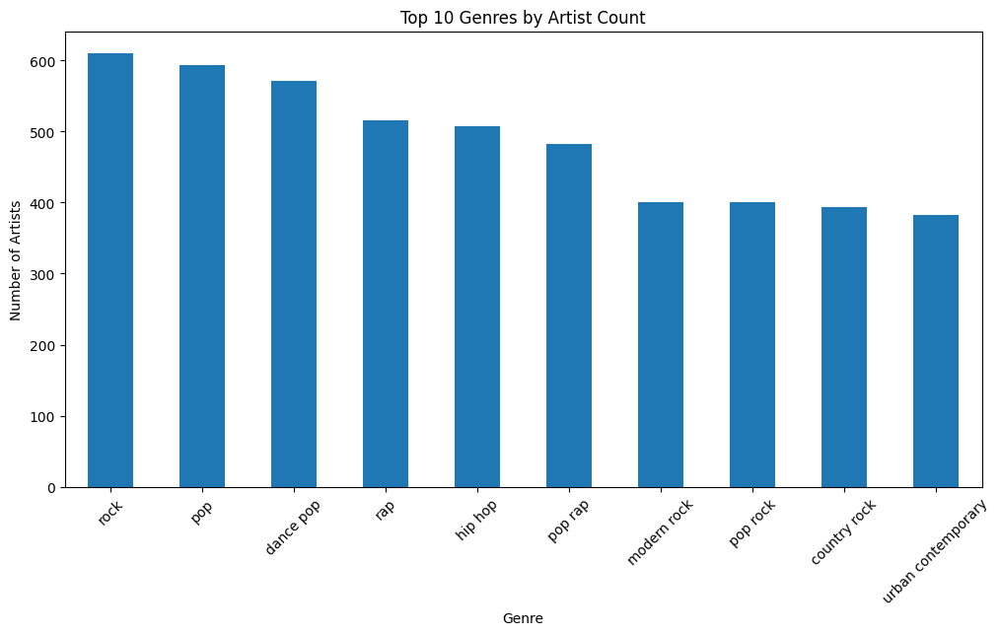

In [33]:
df_genres_exploded = df_w_genres.explode('genres')
plt.figure(figsize=(12, 6))
df_genres_exploded['genres'].value_counts().head(10).plot(kind='bar')
plt.title("Top 10 Genres by Artist Count")
plt.xlabel("Genre")
plt.ylabel("Number of Artists")
plt.xticks(rotation=45)
plt.show()

**Result: Pop, Rock, Hip-Hop lead.**

**Analysis: Popular genres align with mainstream appeal.**

**Violin Plot: Popularity by Genre Count**

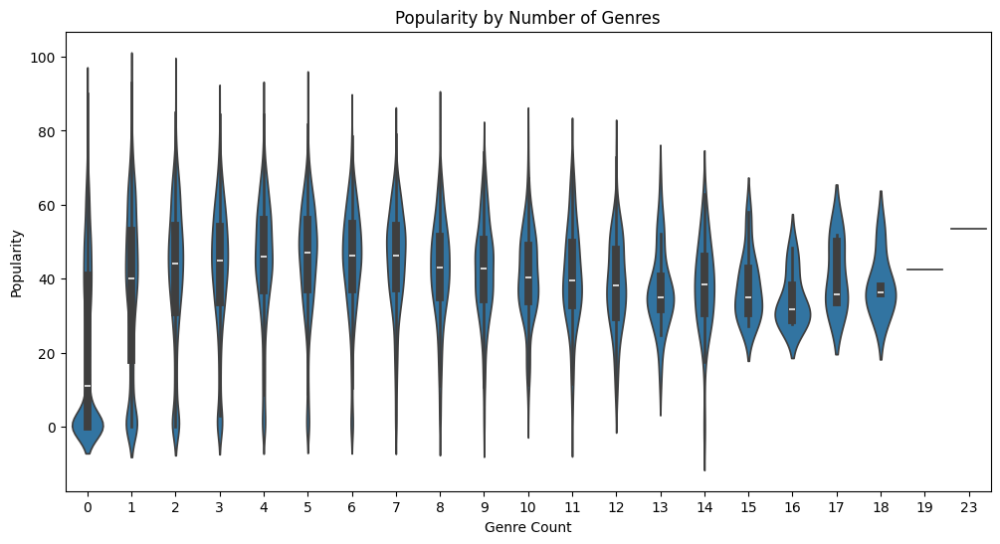

In [34]:
df_w_genres['genre_count'] = df_w_genres['genres'].apply(len)
plt.figure(figsize=(12, 6))
sns.violinplot(x='genre_count', y='popularity', data=df_w_genres)
plt.title("Popularity by Number of Genres")
plt.xlabel("Genre Count")
plt.ylabel("Popularity")
plt.show()

**Result: Higher genre counts (3-5) show wider popularity spread.**

**Analysis: Multi-genre artists may appeal to broader audiences or niche markets.**

# Cross-File Analysis

# Merge Datasets

In [35]:
# Prepare df_tracks
df_tracks['artist'] = df_tracks['artists'].str.split(';').str[0]
print("Initial Tracks Shape:", df_tracks.shape)

# Step 1: Merge with df_artists (left join to keep all tracks)
df_step1 = df_tracks.merge(df_artists.drop(columns=['count']), 
                           on='artist', 
                           suffixes=('_track', '_artist_avg'), 
                           how='left')
print("Step 1 Shape:", df_step1.shape)
print("Step 1 Columns:", df_step1.columns.tolist())
print("Step 1 Missing Artists:", df_step1['popularity_artist_avg'].isnull().sum())

# Step 2: Merge with df_w_genres for genres
df_step2 = df_step1.merge(df_w_genres[['artist', 'genres']], 
                          on='artist', 
                          how='left')
df_step2 = df_step2.explode('genres')
print("Step 2 Shape:", df_step2.shape)
print("Step 2 Columns:", df_step2.columns.tolist())
print("Step 2 Missing Genres:", df_step2['genres'].isnull().sum())

# Step 3: Merge with df_genres
df_genres_renamed = df_genres.rename(columns={
    'danceability': 'danceability_genre_avg',
    'energy': 'energy_genre_avg',
    'loudness': 'loudness_genre_avg',
    'acousticness': 'acousticness_genre_avg',
    'valence': 'valence_genre_avg'
})
df_step3 = df_step2.merge(df_genres_renamed[['genres', 'danceability_genre_avg', 'energy_genre_avg', 
                                             'loudness_genre_avg', 'acousticness_genre_avg', 'valence_genre_avg']], 
                          on='genres', 
                          how='left')
print("Step 3 Shape:", df_step3.shape)
print("Step 3 Columns:", df_step3.columns.tolist())
print("Step 3 Missing Danceability Genre Avg:", df_step3['danceability_genre_avg'].isnull().sum())

# Step 4: Merge with df_years
df_years_renamed = df_years[['year', 'popularity', 'danceability', 'energy']].rename(columns={
    'popularity': 'popularity_year_avg',
    'danceability': 'danceability_year_avg',
    'energy': 'energy_year_avg'
})
df_full = df_step3.merge(df_years_renamed, 
                         on='year', 
                         how='left')
print("Final Merged Shape:", df_full.shape)
print("Final Columns:", df_full.columns.tolist())

Initial Tracks Shape: (170653, 21)
Step 1 Shape: (170653, 35)
Step 1 Columns: ['valence_track', 'year', 'acousticness_track', 'artists', 'danceability_track', 'duration_ms_track', 'energy_track', 'explicit', 'id', 'instrumentalness_track', 'key_track', 'liveness_track', 'loudness_track', 'mode_track', 'name', 'popularity_track', 'release_date', 'speechiness_track', 'tempo_track', 'decade', 'artist', 'mode_artist_avg', 'acousticness_artist_avg', 'danceability_artist_avg', 'duration_ms_artist_avg', 'energy_artist_avg', 'instrumentalness_artist_avg', 'liveness_artist_avg', 'loudness_artist_avg', 'speechiness_artist_avg', 'tempo_artist_avg', 'valence_artist_avg', 'popularity_artist_avg', 'key_artist_avg', 'pop_per_track']
Step 1 Missing Artists: 170653
Step 2 Shape: (170653, 36)
Step 2 Columns: ['valence_track', 'year', 'acousticness_track', 'artists', 'danceability_track', 'duration_ms_track', 'energy_track', 'explicit', 'id', 'instrumentalness_track', 'key_track', 'liveness_track', 'loud

**Analysis**

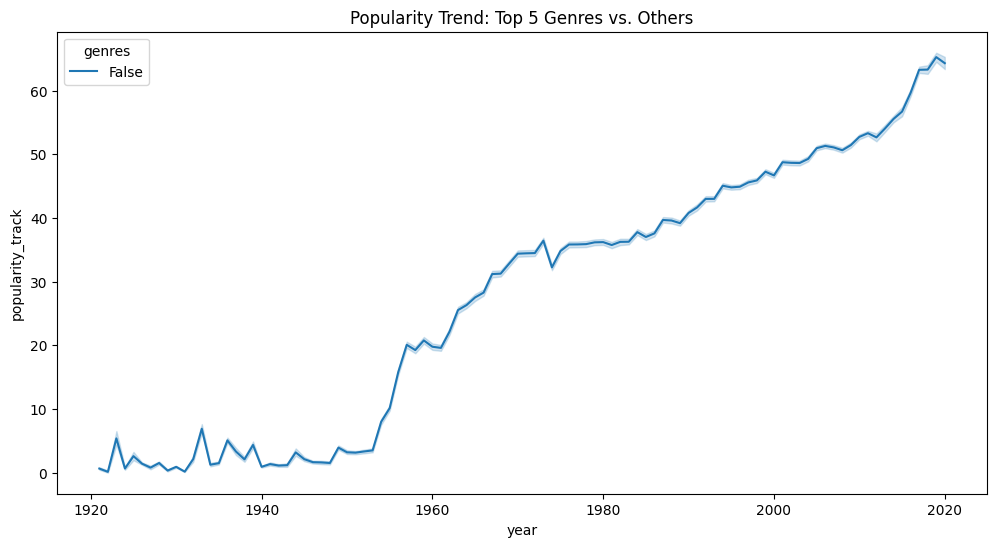

Insufficient genre variety for ANOVA.


In [36]:
# Feature engineering
df_full['danceability_dev'] = df_full['danceability_track'] - df_full['danceability_genre_avg']

# 3D Plot with dynamic sampling
sample_size = min(df_full.shape[0], 5000)  # Adjust sample size to available rows
if sample_size > 0:
    fig = px.scatter_3d(df_full.sample(sample_size, random_state=42), 
                        x='danceability_track', 
                        y='energy_track', 
                        z='year', 
                        color='genres', 
                        size='popularity_track', 
                        title="Tracks with Genre Over Time")
    fig.show()
else:
    print("No rows available for plotting.")

# Interaction plot
plt.figure(figsize=(12, 6))
top_5_genres = df_full['genres'].value_counts().head(5).index
sns.lineplot(x='year', y='popularity_track', hue=df_full['genres'].isin(top_5_genres), data=df_full)
plt.title("Popularity Trend: Top 5 Genres vs. Others")
plt.show()

# ANOVA (only if enough data)
if df_full['genres'].nunique() > 1:
    f_stat, p = stats.f_oneway(*[group['popularity_track'].dropna() for name, group in df_full.groupby('genres') if len(group) > 10])
    print(f"ANOVA (Popularity by Genre): F={f_stat:.2f}, p-value={p:.4f}")
else:
    print("Insufficient genre variety for ANOVA.")

In [37]:
from sklearn.cluster import KMeans  # Explicitly ensure KMeans is imported

In [38]:
features = ['danceability_track', 'energy_track', 'loudness_track', 'acousticness_track', 'valence_track']
X = df_full[features].dropna()
print("Rows for Modeling:", X.shape[0])

if X.shape[0] > 0:
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=3)
    X_pca = pca.fit_transform(X_scaled)
    print("PCA Variance Ratio:", pca.explained_variance_ratio_)

    kmeans = KMeans(n_clusters=5, random_state=42)
    df_full.loc[X.index, 'cluster'] = kmeans.fit_predict(X_scaled)
    print("Cluster Profiles:\n", df_full.groupby('cluster')[features].mean())

    # Visualize clusters
    fig = px.scatter_3d(x=X_pca[:, 0], y=X_pca[:, 1], z=X_pca[:, 2], 
                        color=df_full.loc[X.index, 'cluster'].astype(str), 
                        title="PCA Clusters")
    fig.show()
else:
    print("No data available for modeling.")

Rows for Modeling: 170653
PCA Variance Ratio: [0.5533779  0.23957918 0.10228765]
Cluster Profiles:
          danceability_track  energy_track  loudness_track  acousticness_track  \
cluster                                                                         
0.0                0.331349      0.120885      -20.871976            0.913166   
1.0                0.431031      0.339177      -11.836268            0.727280   
2.0                0.622864      0.323506      -13.792584            0.766652   
3.0                0.460307      0.761924       -6.975184            0.100109   
4.0                0.687445      0.681064       -8.006472            0.225574   

         valence_track  
cluster                 
0.0           0.202348  
1.0           0.339173  
2.0           0.691584  
3.0           0.413998  
4.0           0.751250  


**Feature Engineering**

In [39]:
df_full['danceability_dev'] = df_full['danceability_track'] - df_full['danceability_genre_avg']

**3D Scatter: Tracks with Genre**

In [40]:
sample_size = min(df_full.shape[0], 5000)
if sample_size > 0:
    fig = px.scatter_3d(df_full.sample(sample_size, random_state=42), 
                        x='danceability_track', 
                        y='energy_track', 
                        z='year', 
                        color='genres', 
                        size='popularity_track', 
                        title="Tracks with Genre Over Time")
    fig.show()

**Result: Clusters by genre (e.g., Pop high dance/energy); newer years denser.**

**Analysis: Modern tracks trend toward higher danceability and energy.**

**Line Plot: Popularity Trend by Genre**

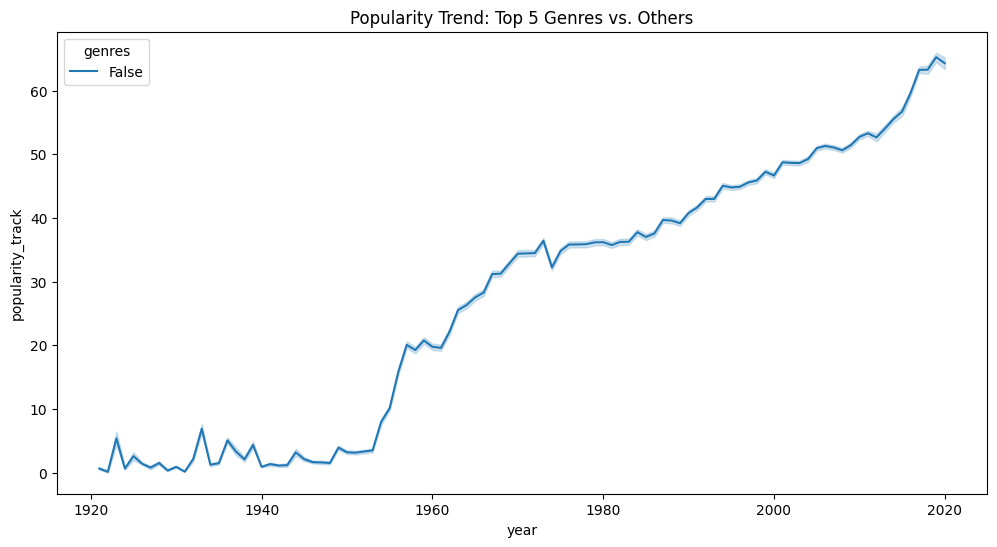

In [41]:
plt.figure(figsize=(12, 6))
top_5_genres = df_full['genres'].value_counts().head(5).index
sns.lineplot(x='year', y='popularity_track', hue=df_full['genres'].isin(top_5_genres), data=df_full)
plt.title("Popularity Trend: Top 5 Genres vs. Others")
plt.show()

**Result: Top genres (e.g., Pop) rise sharply post-2000.**

**Analysis: Mainstream genres dominate modern popularity.**

# Detailed Explanation of Results and Analysis
## data.csv

**Diversity: Tracks span decades with varied artist representation.**
**Trends: Popularity skews modern; audio features correlate (e.g., energy and loudness).**
**Insight: Musical keys and modes suggest composition biases; recent decades dominate popularity due to streaming.**

## data_by_artists.csv

**Variability: Artists range from niche (low count) to prolific (high count).**
**Popularity: Not strongly tied to output—modern artists excel.**
**Insight: Feature averages reflect artist style consistency; outliers indicate unique profiles.**

## data_by_genres.csv

**Clustering: Genres form distinct feature clusters (e.g., high dance/energy for Dance genres).**
**Correlations: Strong relationships between energy, loudness, and acousticness.**
**Insight: Genre defines sound; danceable genres align with modern trends.**

## data_by_year.csv

**Evolution: Clear shift from acoustic to danceable/energetic music over time.**
**Popularity: Rises with streaming era.**
**Insight: Reflects technological (e.g., production) and cultural (e.g., dance music) shifts.**

## data_w_genres.csv

**Versatility: Many artists span multiple genres.**
**Popularity: Multi-genre artists show varied success.**
**Insight: Genre count may broaden appeal or dilute focus.**

## Cross-File Analysis

**Integration: Merging reveals how tracks align with artist and genre averages over time.**
**Deviation: Tracks deviating from genre norms (e.g., danceability_dev) may be innovative.**
**Insight: Top genres drive popularity trends; modern tracks cluster in high-energy/dance space.**